In [1]:
%matplotlib inline

In [2]:
import sys,os
import time
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import seaborn as sns
from IPython.display import display, Markdown
from importlib import reload
from matplotlib import animation, rc
from IPython.display import HTML
rc('animation', html='jshtml')

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})

plt.rcParams.update({"savefig.dpi" : 300}) #Figure resolution
#Define plotting style:
sns.set() #Set style
sns.set_style('ticks',{'font.family':'Times New Roman', 'font.serif':'Times New Roman'})
sns.set_context('paper', font_scale=1.8)
cm = plt.cm.get_cmap('RdYlBu')

colors = sns.color_palette("Paired")

## Probabilidade Clássica (estado inicial)

In [9]:
dp = 0.1
dx = 0.5
x0mean = 1.0
p0mean = 0.0
# Draw gaussian distributed values for x0 e p0
x0vals = np.random.normal(loc=x0mean, scale=dx,size=1000)
p0vals = np.random.normal(loc=p0mean, scale=dp,size=1000)
# Initial values:
q0 = np.array(list(zip(x0vals,p0vals)))

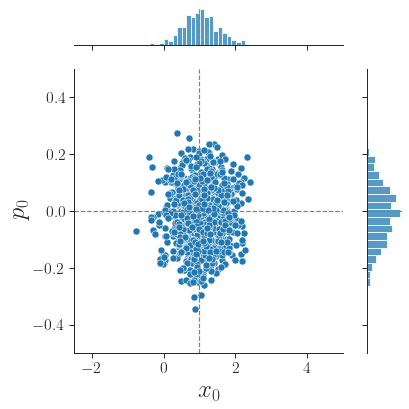

In [17]:
h = sns.jointplot(x=q0[:,0], y=q0[:,1], s=50, color=colors[1])
h.ax_marg_x.set_xlim(-2.5, 5.0)
h.ax_marg_y.set_ylim(-0.5,0.5)
# JointGrid has a convenience function
h.set_axis_labels(r'$x_0$', r'$p_0$', fontsize=25)
h.refline(x=x0mean, y=p0mean)
# labels appear outside of plot area, so auto-adjust
h.figure.tight_layout() 
plt.savefig('probClassica0.png')

## Evolução temporal de cada ponto

In [5]:
m = 1. # massa
dt = 10. # delta t

In [6]:
qt = np.array([(xv+(pv/m)*dt,pv) for xv,pv in q0])

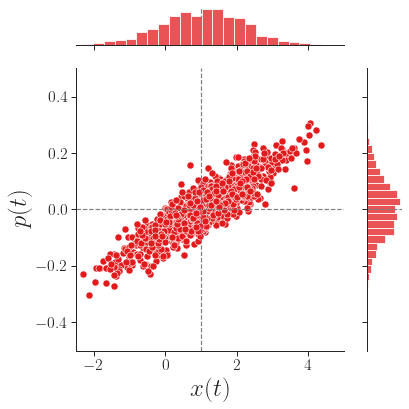

In [18]:
h = sns.jointplot(x=qt[:,0], y=qt[:,1], s=50, color=colors[5])
h.ax_marg_x.set_xlim(-2.5, 5.0)
h.ax_marg_y.set_ylim(-0.5,0.5)
# JointGrid has a convenience function
h.set_axis_labels(r'$x(t)$', r'$p(t)$', fontsize=25)
h.refline(x=x0mean+(p0mean/m)*dt, y=p0mean)
# h.set_title(r'$x = %1.1f \pm %1.1f$' %(x0mean,dx))
# labels appear outside of plot area, so auto-adjust
h.figure.tight_layout() 
plt.savefig('probClassica1.png')

## Animação

In [8]:
######################################################################
# Set up plot
fig, ax = plt.subplots(figsize=(4,3))

scat = ax.scatter(x=q0[:,0],y=q0[:,1],s=30,edgecolors='white')
ax.set_xlabel('$x(t)$')
ax.set_ylabel('$p(t)$')
title = ax.set_title("")
ax.set_xlim(-2.5,5)
ax.set_ylim(-0.5,0.5)
frames = 100  # Number of frames
t_max = 10.0 # Final time
dt = (t_max/frames)
t = 0
plt.tight_layout()

# Animate plot
def init():
    title.set_text(r'$t = $%1.1f' %t)
    return (scat,title)

def animate(i):
    t = i*dt
    scat.set_offsets(list(zip(q0[:,0]+q0[:,1]*(t/m),q0[:,1])))
    title.set_text(r'$t = $%1.1f' %t)
        
    return (scat,title)

# call the animator.  blit=True means only re-draw the parts that have changed.
#Para salvar corretamente, tem que descomentar a linha de baixo
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=frames, interval=100, blit=True)


# anim.save('probClassicaEvolution.mp4', fps=15, extra_args=['-vcodec', 'libx264'])

#Para ver o video no notebook deve comentar a linha de cima
plt.close()
anim
